# Digital Image Processing (INT3404 20)

Diep Ng.

In [1]:
import numpy as np
import cv2
import imutils
import matplotlib.pyplot as plt
%matplotlib inline

# Week 8: Heatmap (answer)

https://matplotlib.org/users/colormaps.html


```
Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, inferno, inferno_r, jet, jet_r, magma, magma_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, twilight, twilight_r, twilight_shifted, twilight_shifted_r, viridis, viridis_r, winter, winter_r
```

In [36]:
z

array([[-4.07401958e-06, -5.80419456e-06, -8.21033811e-06, ...,
        -6.72840694e-06, -4.69544677e-06, -3.25160068e-06],
       [-5.32527730e-06, -7.58242716e-06, -1.07196767e-05, ...,
        -8.59565917e-06, -5.99328471e-06, -4.14652338e-06],
       [-6.90348822e-06, -9.82322941e-06, -1.38789000e-05, ...,
        -1.08568771e-05, -7.56221943e-06, -5.22637339e-06],
       ...,
       [ 5.28848875e-06,  7.65124794e-06,  1.09835457e-05, ...,
         1.40055685e-05,  9.91225792e-06,  6.96560358e-06],
       [ 4.19018094e-06,  6.05585807e-06,  8.68468768e-06, ...,
         1.08087052e-05,  7.64500051e-06,  5.36893485e-06],
       [ 3.28206063e-06,  4.73910432e-06,  6.79052231e-06, ...,
         8.27245347e-06,  5.84785211e-06,  4.10447954e-06]])

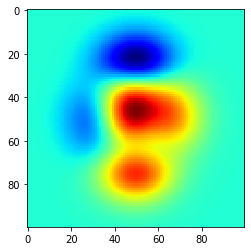

In [37]:
y, x = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))
z = (1 - x / 2. + x ** 5 + y ** 3) * np.exp(-x ** 2 - y ** 2)
plt.imshow(z, cmap='jet')

# Week 9: Fourier transform

# Discrete Fourier Transform

http://code.activestate.com/recipes/578994-discrete-fourier-transform/

The discrete Fourier transform transforms a sequence of $N$ **complex numbers** $   \left \{ \mathbf{ f_n } \right \} := f_0, f_1, \ldots, f_{N-1}$ into another sequence of complex numbers,  $\left \{ \mathbf{F_k} \right \} := F_0, F_1, \ldots, F_{N-1},$ which is defined by

<math>\begin{align}
  F_k &= \frac{1}{N}\sum_{n=0}^{N-1} f_n \cdot e^{-\frac {i 2\pi}{N}kn}\\
      &= \frac{1}{N}\sum_{n=0}^{N-1} f_n \cdot \left[\cos\left(\frac{2 \pi}{N}kn\right) - i \cdot \sin\left(\frac{2 \pi}{N}kn\right)\right],
\end{align}</math>

where the last expression follows from the first one by Euler's formula.


Inverse DFT:

$f_n = \frac{1}{N}\sum_{n=0}^{N-1} F_k \cdot e^{\frac {i 2\pi}{N}kn}$


In [5]:
# Discrete Fourier Transform (DFT)
# FB - 20141227
import random
import math
import cmath
pi2 = cmath.pi * 2.0
def DFT(fnList):
    N = len(fnList)
    FkList = []
    for k in range(N): #frequency
        Fk = 0.0
        for n in range(N):
            Fk += fnList[n] * cmath.exp(- 1j * pi2 * k * n / N)
        FkList.append(Fk / N)
    return FkList

#or using matrix
# Mkn = e^(-i2pi k n/N)
def DFT_matrix(x):
    import numpy as np
    """Compute the discrete Fourier Transform of the 1D array x"""
    x = np.asarray(x, dtype=float)
    N = x.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    M = np.exp(-2j * np.pi * k * n / N)
    print("Matrix shape", M.shape)
    return np.dot(M, x)


def InverseDFT(FkList):
    N = len(FkList)
    fnList = []
    for n in range(N):
        fn = 0.0
        for k in range(N):
            fn += FkList[k] * cmath.exp(1j * pi2 * k * n / N)
        fnList.append(fn)
    return fnList

# TEST
print("Input Sine Wave Signal:")
N = 10 # degrees (Number of samples)
a = 1 #float(random.randint(1, 100))
f = 2 #float(random.randint(1, 100))
p = 0#float(random.randint(0, 360))

print("frequency = " + str(f))
print ("amplitude = " + str(a))
print ("phase ang = " + str(p))
print
fnList = []
for n in range(N):
    t = float(n) / N * pi2
    fn = a * math.sin(f * t + p / 360 * pi2)
    fnList.append(fn)

print("original signal: ", fnList)
print("---------")
print ("DFT Calculation Results:")
FmList = DFT(fnList)
print("DFT spectrum: ", FmList)
threshold = 0.001
for (i, Fm) in enumerate(FmList):
    if abs(Fm) > threshold:
        print ("frequency = " + str(i))
        print ("amplitude = " + str(abs(Fm) * 2.0))
        p = int(((cmath.phase(Fm) + pi2 + pi2 / 4.0) % pi2) / pi2 * 360 + 0.5)
        print ("phase ang = " + str(p))
        print

### Recreate input signal from DFT results and compare to input signal
##fnList2 = InverseDFT(FmList)
##for n in range(N):
##    print fnList[n], fnList2[n].real


Input Sine Wave Signal:
frequency = 2
amplitude = 1
phase ang = 0
original signal:  [0.0, 0.9510565162951535, 0.5877852522924732, -0.587785252292473, -0.9510565162951536, -2.4492935982947064e-16, 0.9510565162951534, 0.5877852522924734, -0.5877852522924728, -0.9510565162951538]
---------
DFT Calculation Results:
DFT spectrum:  [0j, (2.2204460492503132e-17+1.1102230246251566e-17j), (1.6653345369377347e-17-0.5j), (2.2204460492503132e-17+2.2204460492503132e-17j), (4.4408920985006264e-17+2.2204460492503132e-17j), (3.3306690738754695e-17+4.448789906830958e-17j), (4.4408920985006264e-17+6.661338147750939e-17j), (2.2759572004815707e-16+2.6645352591003756e-16j), (-5.939693181744587e-16+0.5j), (-3.6637359812630164e-16-4.440892098500626e-16j)]
frequency = 2
amplitude = 1.0
phase ang = 0
frequency = 8
amplitude = 1.0
phase ang = 180


In [6]:

DFT_matrix(fnList)

Matrix shape (10, 10)


array([ 0.00000000e+00+0.00000000e+00j,  2.22044605e-16+1.11022302e-16j,
        1.66533454e-16-5.00000000e+00j, -2.22044605e-16-6.66133815e-16j,
        4.44089210e-16+2.22044605e-16j,  3.33066907e-16-2.93395250e-15j,
       -1.55431223e-15+0.00000000e+00j,  6.10622664e-16+6.66133815e-16j,
       -5.93969318e-15+5.00000000e+00j,  2.22044605e-16+9.99200722e-16j])

In [39]:
np.abs(3+4j)

5.0

In [32]:
x = np.random.random(1024)
np.allclose(DFT_matrix(x), np.fft.fft(x))

True

In [35]:
%timeit DFT(x)
%timeit DFT_matrix(x)
%timeit  np.fft.fft(x) #fast fourier transform

4.92 s ± 63.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
42.5 ms ± 526 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
40.8 µs ± 230 ns per loop (mean ± std. dev. of 7 runs, 10000 loops each)


# 2D Discrete Fourier transform

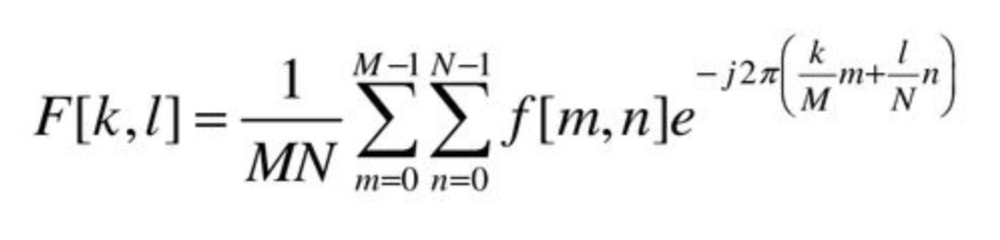

## Example

In [4]:
size = 21
a = np.zeros((size, size))

a1 = a.copy()
a2 = a.copy()
a3 = a.copy()
a4 = a.copy()
for i in range(0, size, 2):
    a1[i, :] = 255
    a3[:, i] = 255

for i in range(0, size, 10):
    a2[i:i+5, :] = 255
    a4[:, i:i+5] = 255


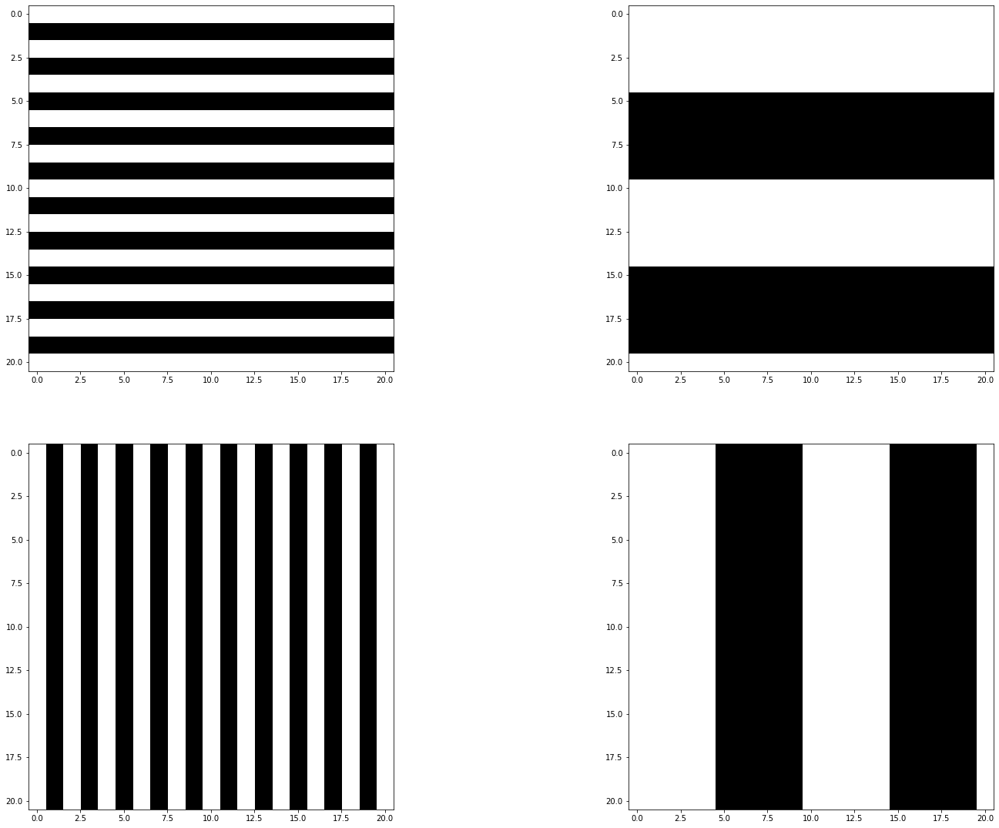

In [5]:
plt.figure(figsize=(6.4*4, 4.8*4), constrained_layout=False)
plt.subplot(2, 2, 1)
plt.imshow(a1, cmap='gray')
plt.subplot(2, 2, 2)
plt.imshow(a2, cmap='gray')
plt.subplot(2, 2, 3)
plt.imshow(a3, cmap='gray')
plt.subplot(2, 2, 4)
plt.imshow(a4, cmap='gray')

In [6]:
def fourier_magnitude(img, shift=True):
    f = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    if shift:
        f_shift = np.fft.fftshift(f)
    else:
        f_shift = f
    f_complex = f_shift[:,:,0] + 1j*f_shift[:,:,1] #make complex numbers
    f_abs = np.abs(f_complex) + 1 # return magnitude of complex number; lie between 1 and 1e6
    f_bounded = 30 * np.log(f_abs) #rescale the value
    f_img = 255 * f_bounded / np.max(f_bounded) #in range 0, 255
    f_img = f_img.astype(np.uint8)
    return f_img

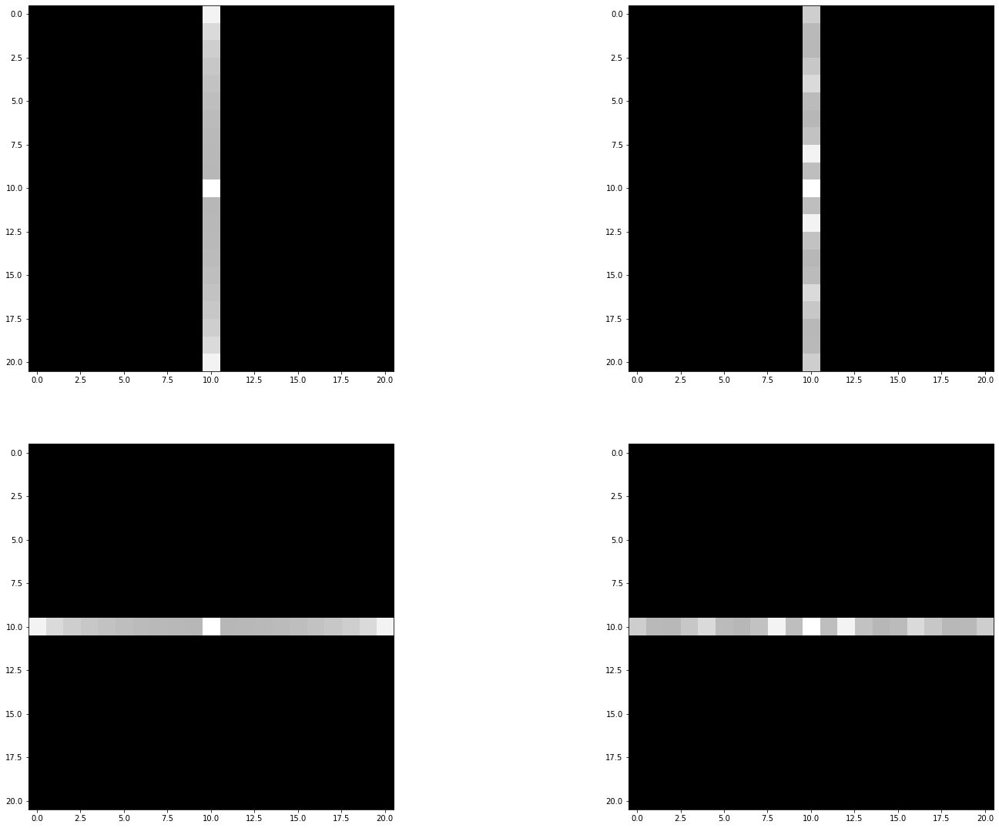

In [7]:
results = list(map(fourier_magnitude, [a1, a2, a3, a4]))
plt.figure(figsize=(6.4*4, 4.8*4), constrained_layout=False)
for i in range(4):
    ri = results[i]
    ri = ri + 250
    plt.subplot(2, 2, i+1)
    plt.imshow(results[i], cmap='gray')

In [8]:
abs(3+4j)

5.0

## Fourier without shifting coordinates

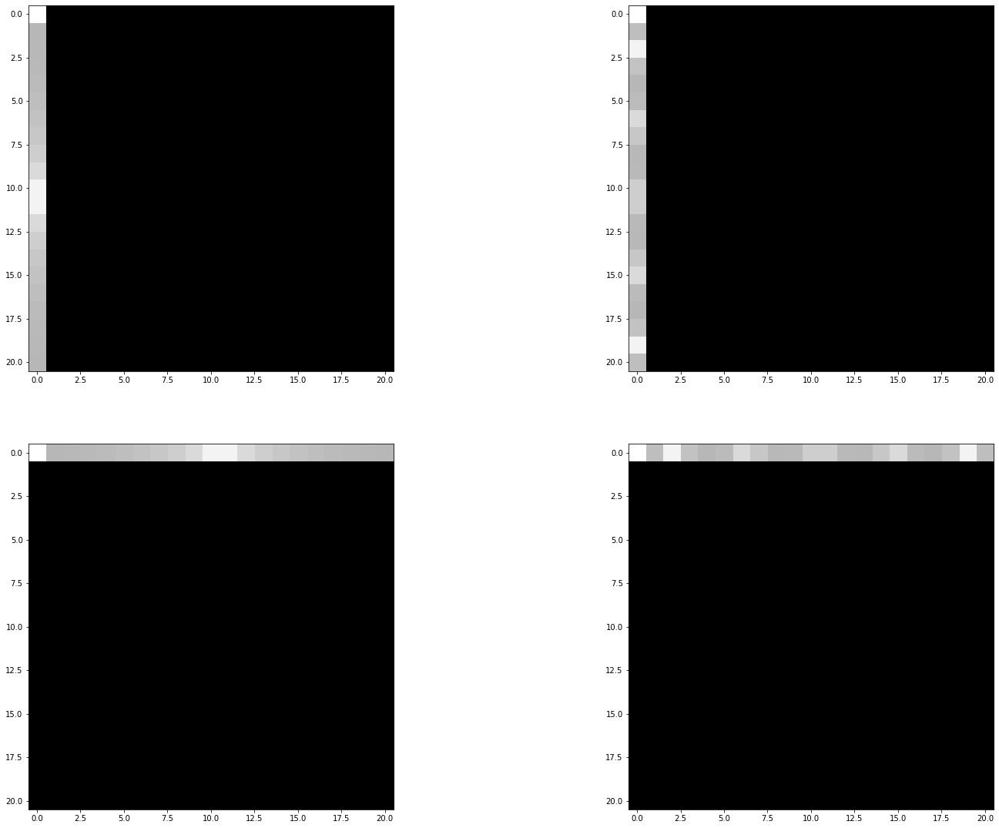

In [10]:
from functools import partial
results = list(map(partial(fourier_magnitude, shift=False), [a1, a2, a3, a4]))
plt.figure(figsize=(6.4*4, 4.8*4), constrained_layout=False)
for i in range(4):
    ri = results[i]
    ri = ri + 250
    plt.subplot(2, 2, i+1)
    plt.imshow(results[i], cmap='gray')

# Pattern and Fourier transform

In [11]:
def get_spectrum(image):
    dft = cv2.dft(np.float32(image),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1])) #magnitude, spectrum, energy
    
    return magnitude_spectrum

def display_fourier(iname, cmap='gray'):
    image = cv2.imread(iname, 0)
    spectrum = get_spectrum(image)
    #show the result
    plt.figure(figsize=(6.4*4, 4.8*4), constrained_layout=False)
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray'), plt.title("image")
    plt.subplot(1,2, 2)
    plt.imshow(spectrum, cmap=cmap), plt.title("fourier spectrum")
    plt.show()

fourier_test_imgs/f7.png


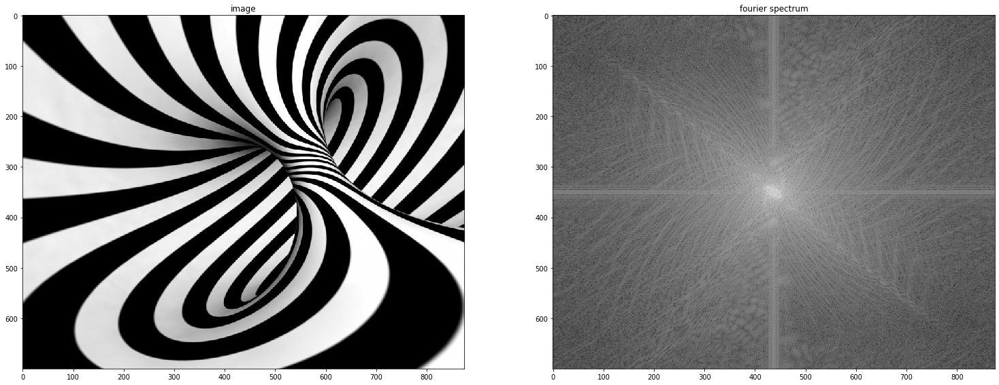

fourier_test_imgs/f6.png


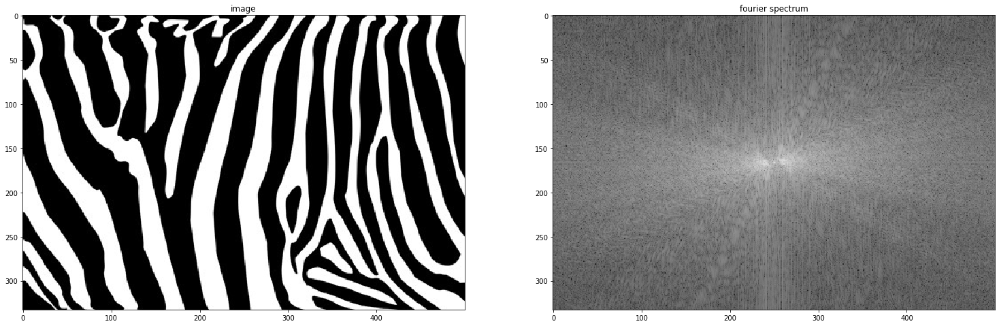

fourier_test_imgs/f4.png


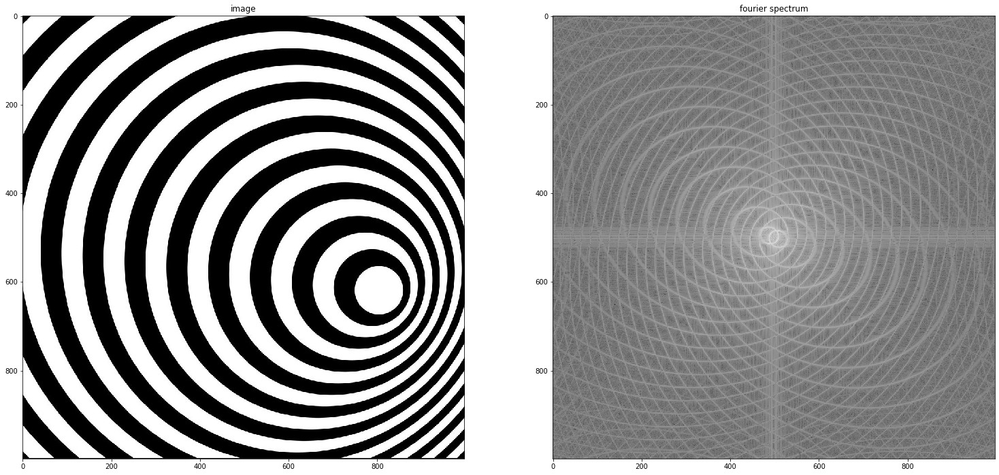

fourier_test_imgs/f5.png


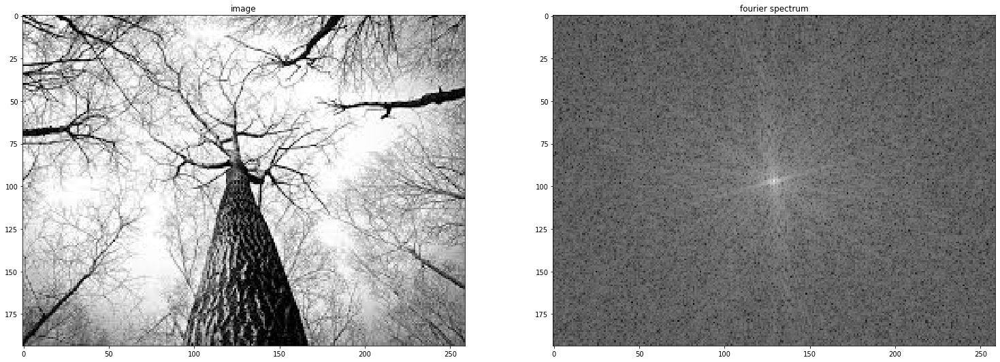

fourier_test_imgs/f1.png


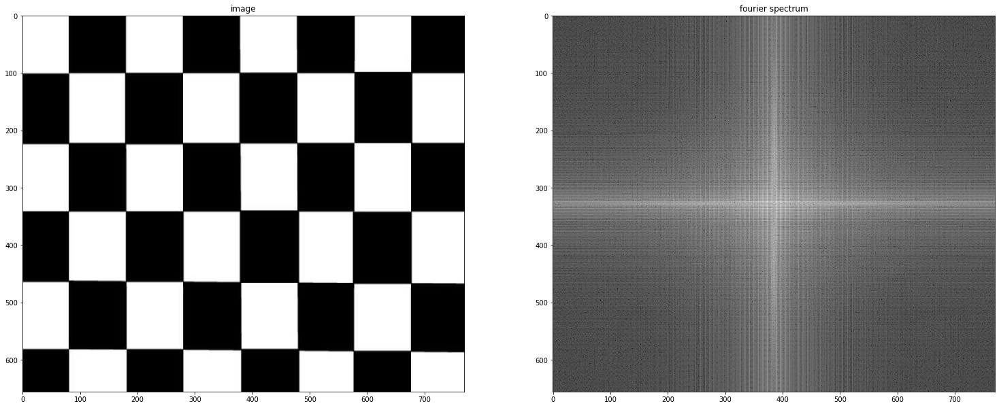

fourier_test_imgs/f2.png


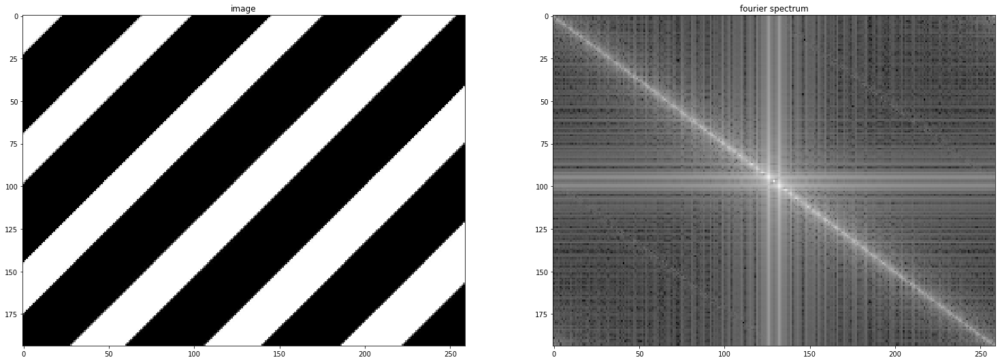

fourier_test_imgs/f3.png


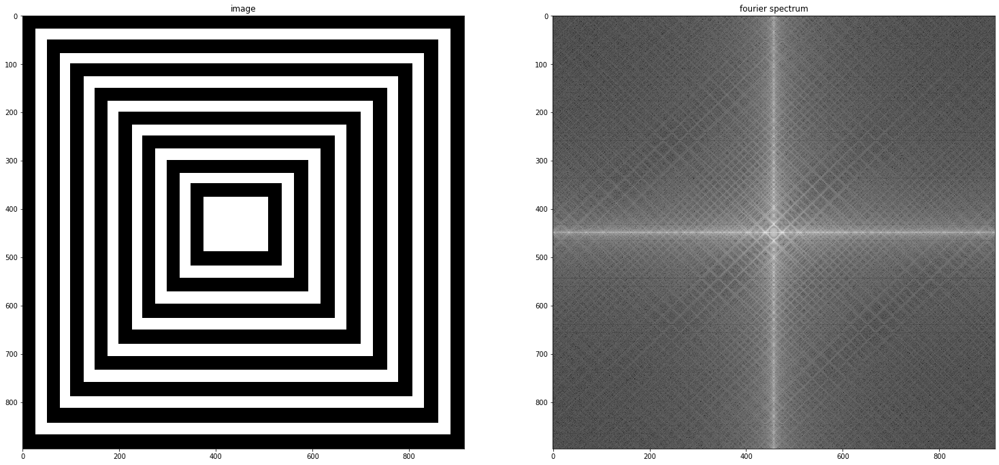

fourier_test_imgs/f8.png


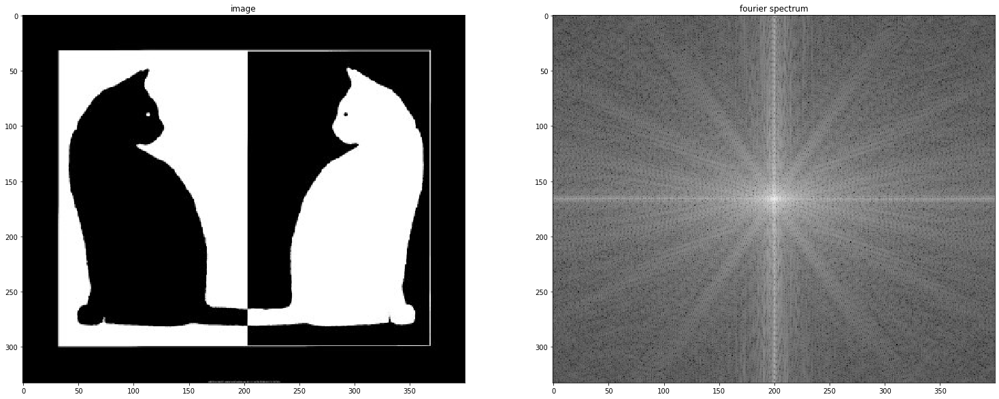

fourier_test_imgs/f9.png


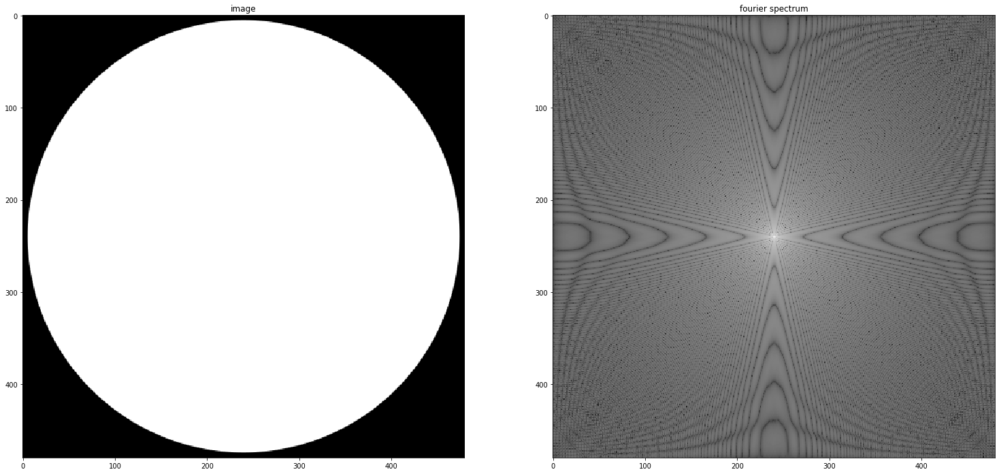

fourier_test_imgs/f12.png


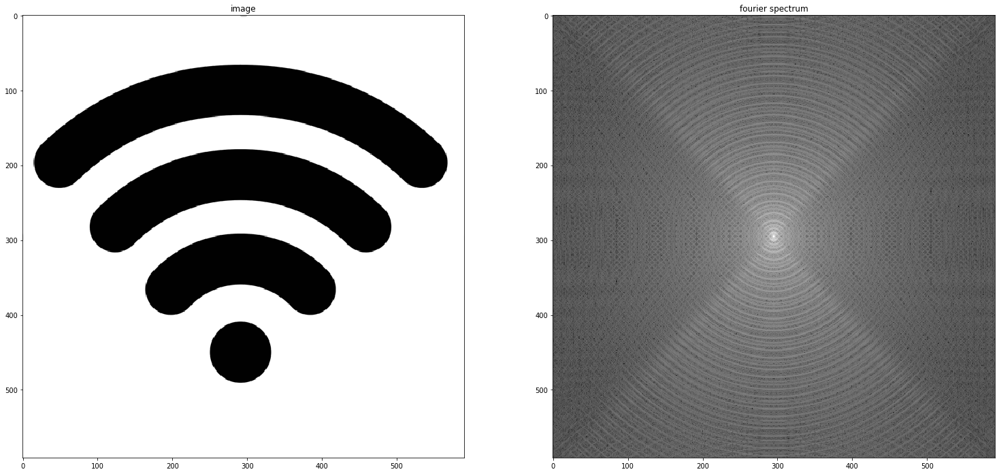

fourier_test_imgs/f10.png


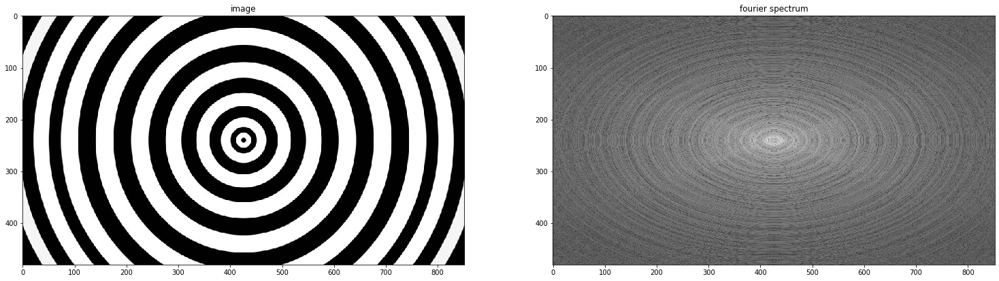

fourier_test_imgs/f11.png


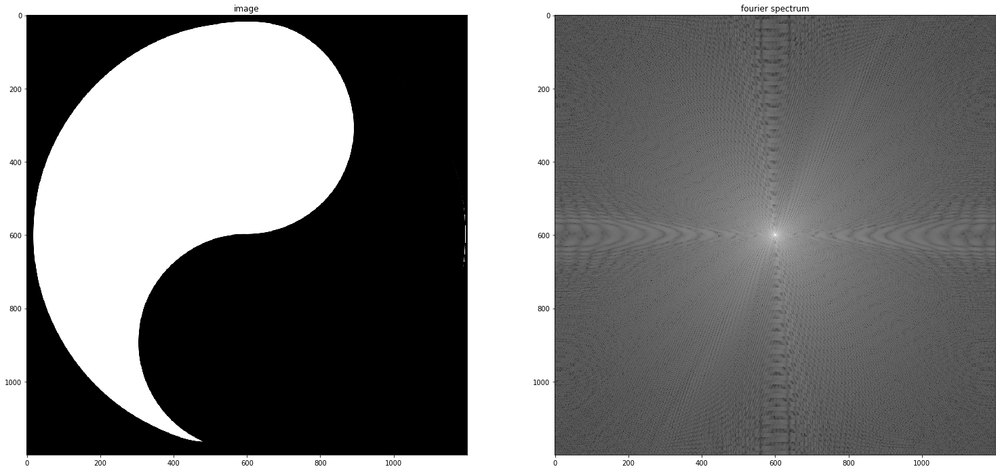

In [13]:
import glob
inames = glob.glob('fourier_test_imgs/*.png')
for iname in inames:
    print(iname)
    display_fourier(iname, cmap='gray')

quiz_imgs/beach.png


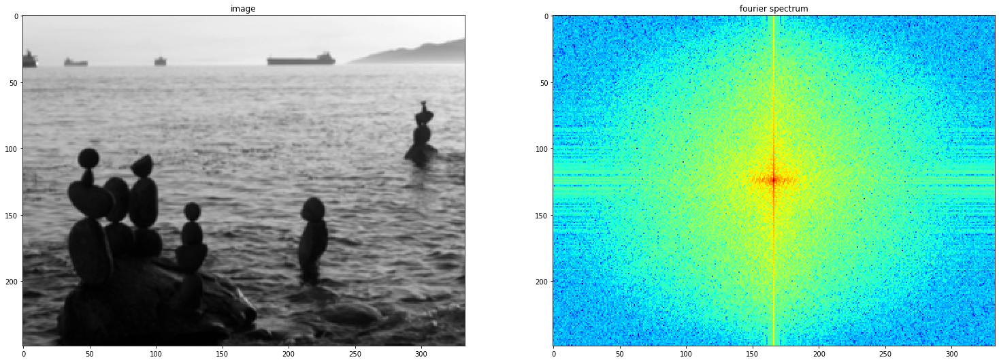

quiz_imgs/window.png


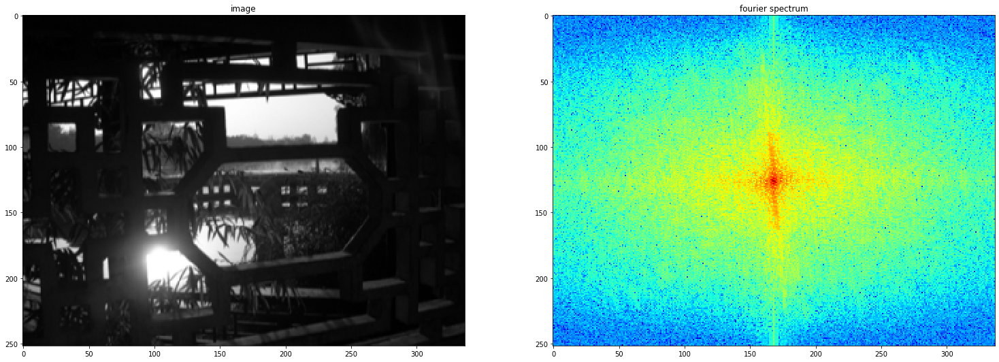

quiz_imgs/flower.png


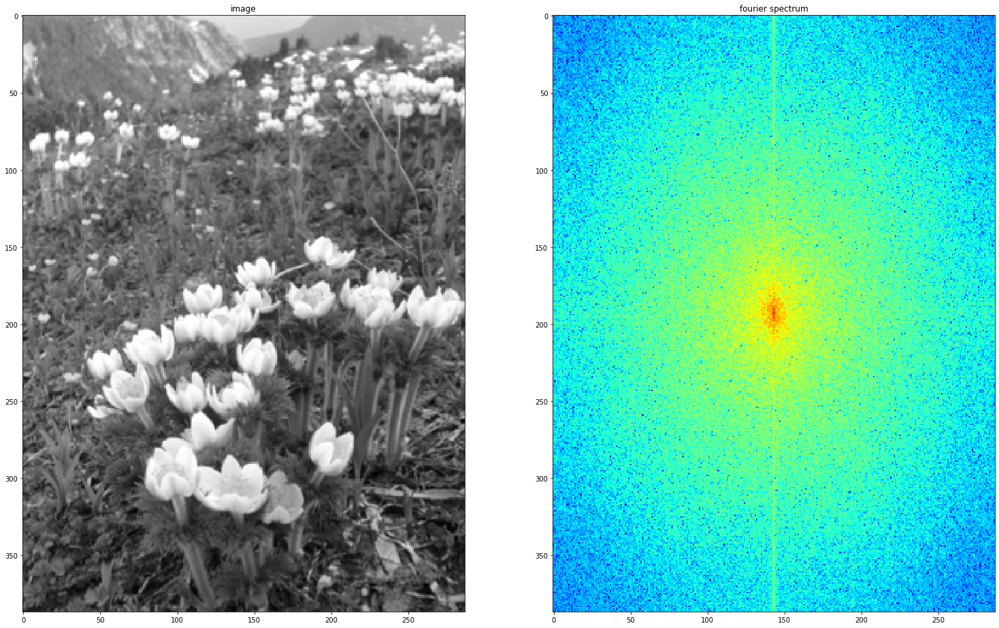

In [14]:
#Quiz

inames = glob.glob('quiz_imgs/*.png')
for iname in inames:
    print(iname)
    display_fourier(iname, cmap='jet')

# High/low-pass filtering

Reference: https://medium.com/@hicraigchen/digital-image-processing-using-fourier-transform-in-python-bcb49424fd82

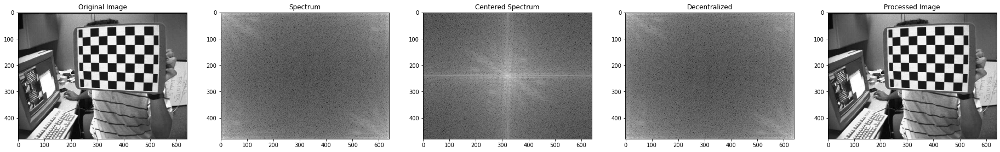

In [40]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img_c1 = cv2.imread("example.jpg", 0)
img_c2 = np.fft.fft2(img_c1)
img_c3 = np.fft.fftshift(img_c2)
img_c4 = np.fft.ifftshift(img_c3)
img_c5 = np.fft.ifft2(img_c4)

plt.subplot(151), plt.imshow(img_c1, "gray"), plt.title("Original Image")
plt.subplot(152), plt.imshow(np.log(1+np.abs(img_c2)), "gray"), plt.title("Spectrum")
plt.subplot(153), plt.imshow(np.log(1+np.abs(img_c3)), "gray"), plt.title("Centered Spectrum")
plt.subplot(154), plt.imshow(np.log(1+np.abs(img_c4)), "gray"), plt.title("Decentralized")
plt.subplot(155), plt.imshow(np.abs(img_c5), "gray"), plt.title("Processed Image")

plt.show()

In [41]:
np.allclose(img_c1, img_c5)

True

In [16]:
dft = cv2.dft(np.float32(img_c1),flags = cv2.DFT_COMPLEX_OUTPUT)
# shift the zero-frequncy component to the center of the spectrum
dft_shift = np.fft.fftshift(dft)
# save image of the image in the fourier domain.
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

In [17]:
dft_shift.shape

(480, 640, 2)

## Low-pass filter

Filter that only allows low frequencies to pass through.
Low frequencies = pixel values that are changing slowly (e.g., smooth area) --> remove noise

In [18]:
cv2.idft??

(480, 640)


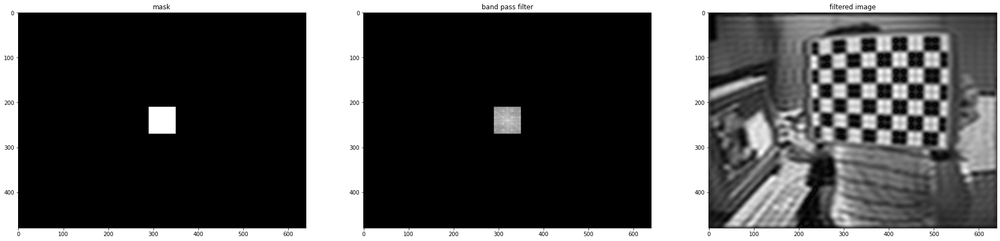

In [2]:
image = cv2.imread("example.jpg", 0)
dft = cv2.dft(np.float32(image),flags = cv2.DFT_COMPLEX_OUTPUT)
# shift the zero-frequncy component to the center of the spectrum
dft_shift = np.fft.fftshift(dft)

#create kernel as mask
kernel_size = 30
base = np.zeros(image.shape[:2])
print(image.shape)
rows, cols = image.shape[:2]
crow, ccol = (rows//2,cols//2)
#create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
mask[crow-kernel_size:crow+kernel_size, ccol-kernel_size:ccol+kernel_size] = 1

def apply_filter(mask, dft_shift):
    ##magnitude image
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

    #apply mask and do inverse dft
    fshift = dft_shift * mask

    #apply mask to magnitude (displaying purpose)
    magnitude_mask = magnitude_spectrum * mask[...,0]

    #do the inverse FFT
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)

    #magnitude
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    #show the result
    plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
    plt.subplot(1, 3, 1)
    plt.imshow(mask[...,0], cmap='gray'), plt.title("mask")
    plt.subplot(1,3, 2)
    plt.imshow(magnitude_mask, cmap='gray'), plt.title("band pass filter")
    plt.subplot(1, 3, 3)
    plt.imshow(img_back, cmap='gray'), plt.title("filtered image")
    

apply_filter(mask, dft_shift)

## High-pass filter

High frequencies (e.g., pixel values that are changing dramatically such as edges)

--> sharpen the original image

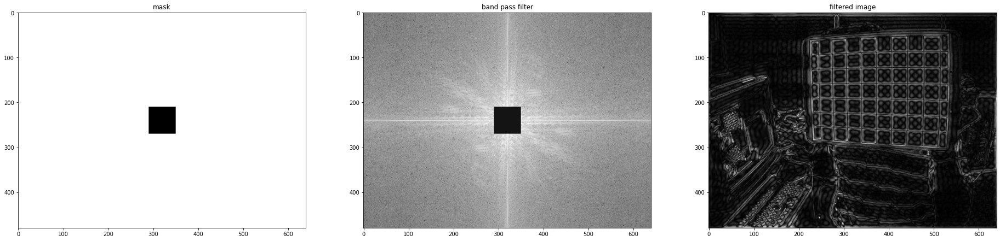

In [3]:
mask = 1 - mask

apply_filter(mask, dft_shift)

## Ideal filter

Ref: https://medium.com/@hicraigchen/digital-image-processing-using-fourier-transform-in-python-bcb49424fd82

Formula for ideal low pass filter where D₀ is a positive constant and D(u, v) is the distance between a point (u, v) in the frequency domain and the center of the frequency rectangle
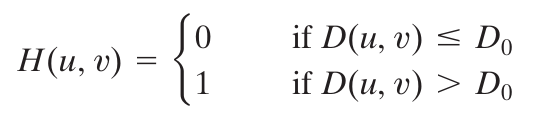

Formula for ideal high pass filter where D₀ is a positive constant and D(u, v) is the distance between a point (u, v) in the frequency domain and the center of the frequency rectangle
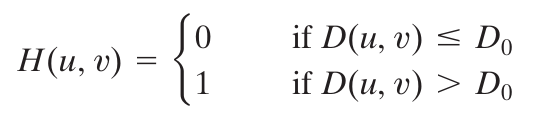

In [4]:

def distance(point1,point2):
    from math import sqrt
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

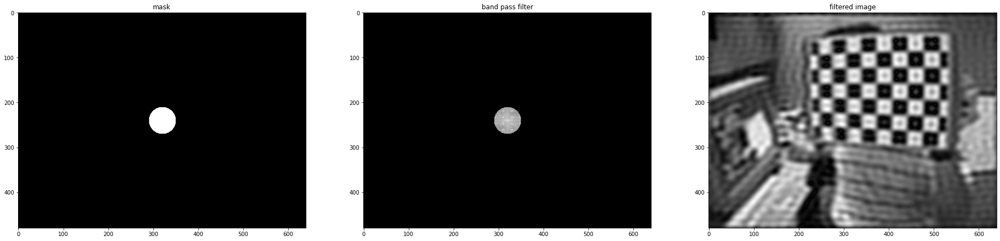

In [5]:
mask = idealFilterLP(30, image.shape)

mask = np.dstack([mask, mask])
apply_filter(mask, dft_shift)

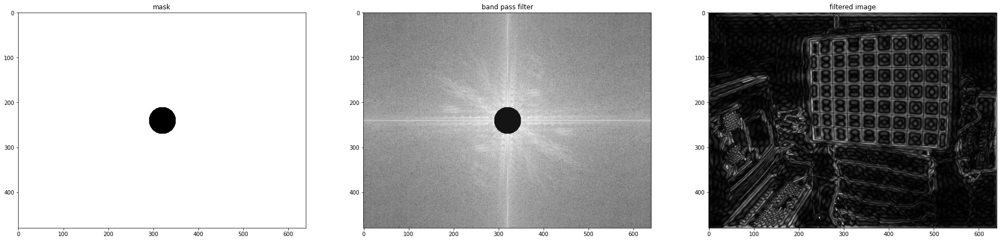

In [6]:
mask = idealFilterHP(30, image.shape)
mask = np.dstack([mask, mask])
apply_filter(mask, dft_shift)

# Butterworth filter

Formula for Butterworth low pass filter where D₀ is a positive constant and D(u, v) is the distance between a point (u, v) in the frequency domain and the center of the frequency rectangle

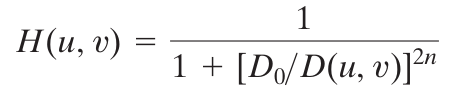


Formula for Butterworth high pass filter where D₀ is a positive constant and D(u, v) is the distance between a point (u, v) in the frequency domain and the center of the frequency rectangle
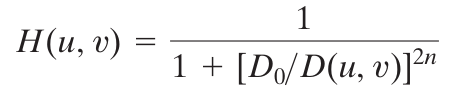

In [7]:
def distance(point1,point2):
    from math import sqrt
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def butterworthLP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

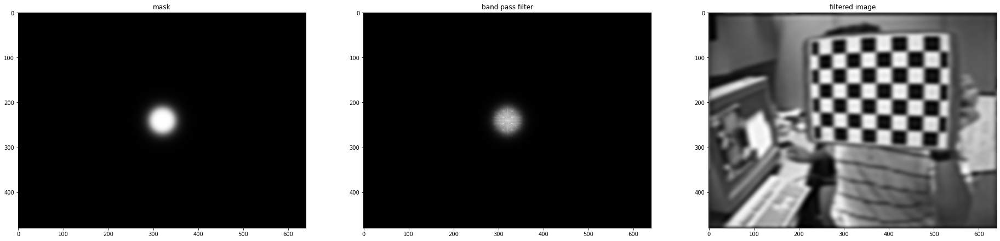

In [8]:
mask = butterworthLP(30, image.shape, 3)
mask = np.dstack([mask, mask])
apply_filter(mask, dft_shift)

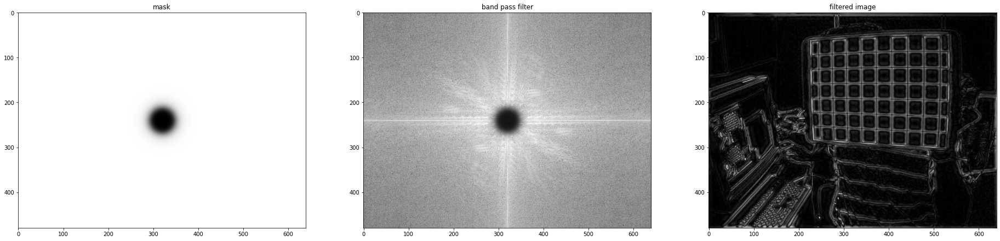

In [9]:
mask = butterworthHP(30, image.shape, 3)
mask = np.dstack([mask, mask])
apply_filter(mask, dft_shift)

## Gaussian filter


In [27]:
def distance(point1,point2):
    from math import sqrt
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def gaussianLP(D0,imgShape):
    from math import exp
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    from math import exp
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

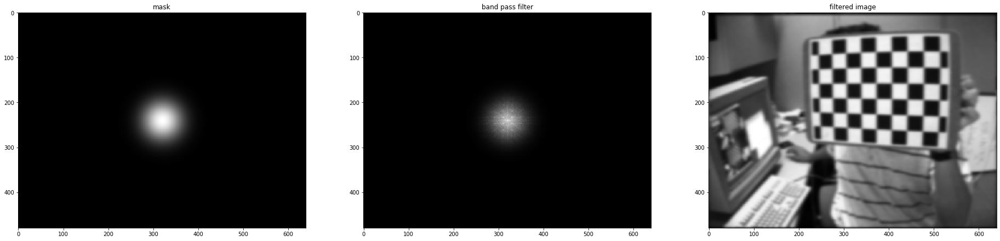

In [28]:
mask = gaussianLP(30, image.shape)
mask = np.dstack([mask, mask])
apply_filter(mask, dft_shift)

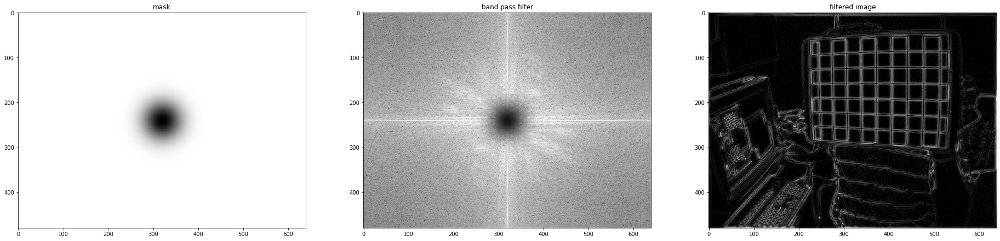

In [29]:
mask = gaussianHP(30, image.shape)
mask = np.dstack([mask, mask])
apply_filter(mask, dft_shift)

# Low/high frequency filtering

In [23]:
def filter_img(iname, radius):
    image = cv2.imread(iname, 0)
    dft = cv2.dft(np.float32(image),flags = cv2.DFT_COMPLEX_OUTPUT)
    # shift the zero-frequncy component to the center of the spectrum
    dft_shift = np.fft.fftshift(dft)
    mask = butterworthHP(radius, image.shape, 3)
    mask = np.dstack([mask, mask])
    apply_filter(mask, dft_shift)


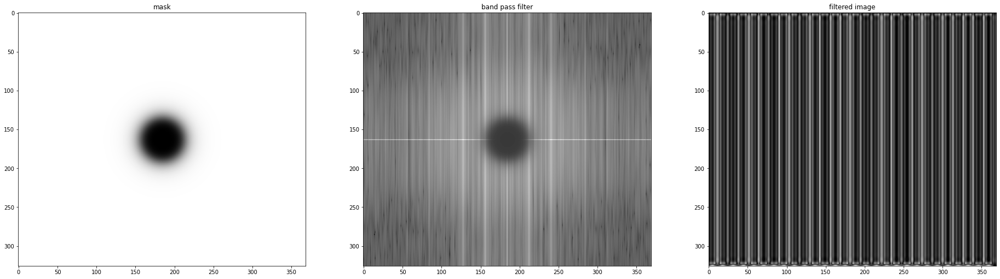

In [24]:
filter_img('highfreq.png', 30)

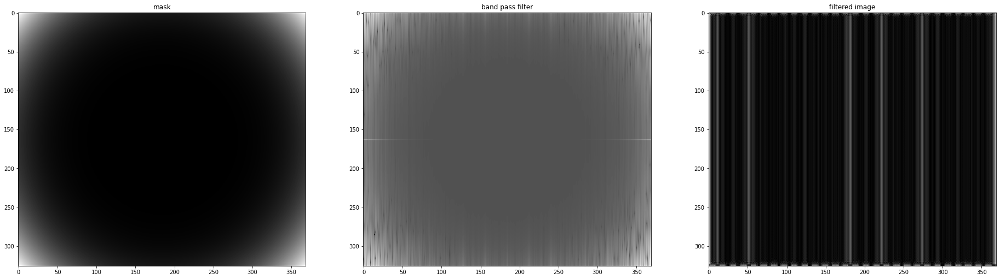

In [25]:
filter_img('highfreq.png', 400)

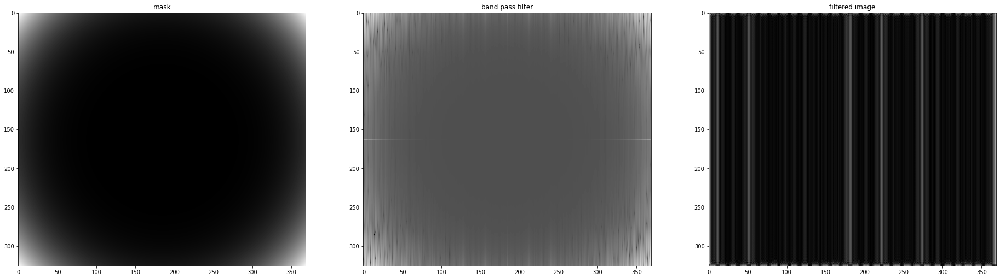

In [26]:
filter_img('highfreq.png', 6000)

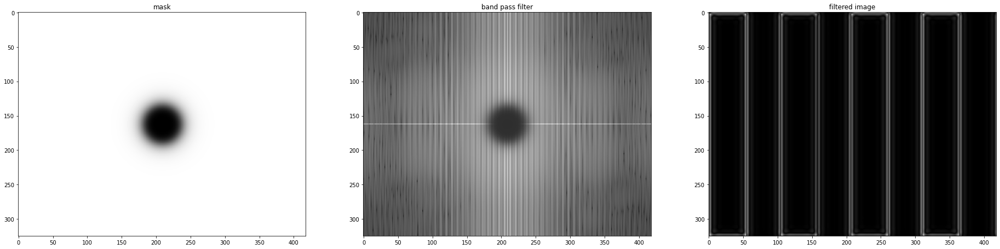

In [27]:
filter_img('lowfreq.png', 30)

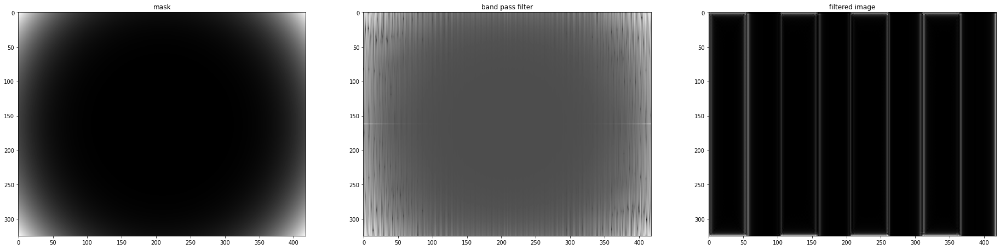

In [28]:
filter_img('lowfreq.png', 400)